In [1]:
!nvidia-smi

Thu Sep 28 21:45:18 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!pip install ultralytics


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.5/615.5 kB 7.1 MB/s eta 0:00:00


In [3]:
!pip3 install torch torchvision


In [4]:
from ultralytics import YOLO
import ultralytics
import os
from IPython.display import display, Image
from IPython import display
display.clear_output()
!yolo mode=checks

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
  File "/usr/local/lib/python3.10/dist-packages/ultralytics/cfg/__init__.py", line 393, in entrypoint
    raise ValueError(f"Invalid 'mode={mode}'. Valid modes are {MODES}.\n{CLI_HELP_MSG}")
ValueError: Invalid 'mode=<module 'ultralytics.utils.checks' from '/usr/local/lib/python3.10/dist-packages/ultralytics/utils/checks.py'>'. Valid modes are ('train', 'val', 'predict', 'export', 'track', 'benchmark').

    Arguments received: ['yolo', 'mode=checks']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of ('detect', 'segment', 'classify', 'pose')
                MODE (required) is one of ('train', 'val', 'predict', 'export', 'track', 'benchmark')
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' that override defaults.
                    See all ARGS at https://d

In [7]:
HOME = os.getcwd()
print(HOME)

/content


In [6]:


!yolo task=detect mode=train model=yolov8m.pt data=/content/drive/MyDrive/YOLO_dataset/data.yaml epochs=25 imgsz=640 plots=True

100% 49.7M/49.7M [00:00<00:00, 70.2MB/s]
Ultralytics YOLOv8.0.188 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/MyDrive/YOLO_dataset/data.yaml, epochs=25, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_mas

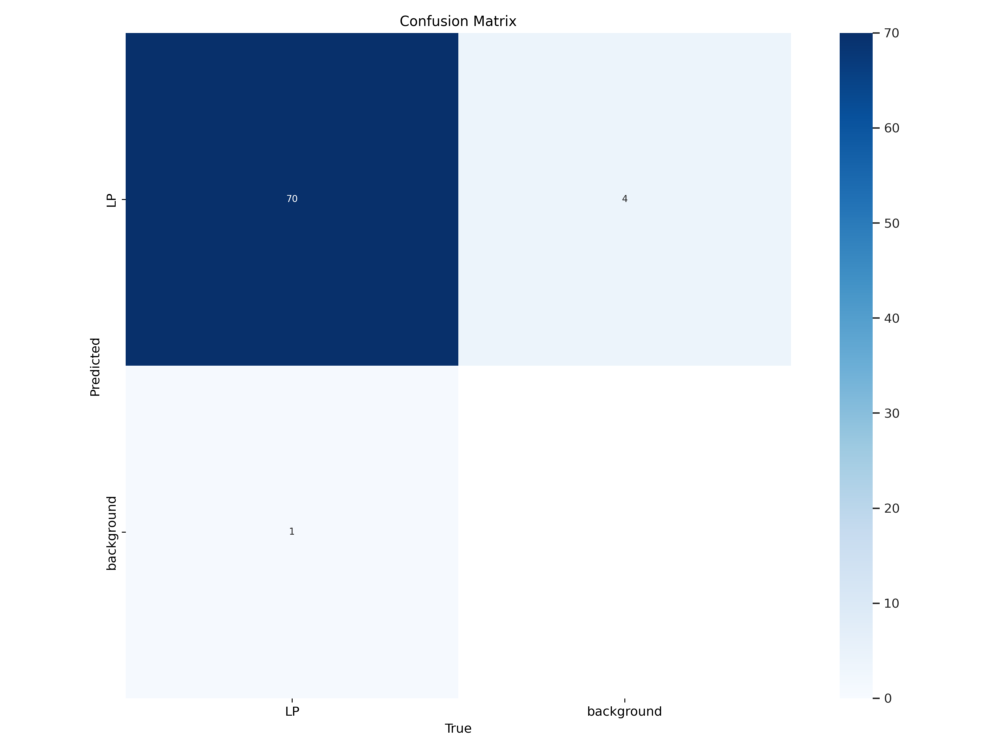

In [8]:
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

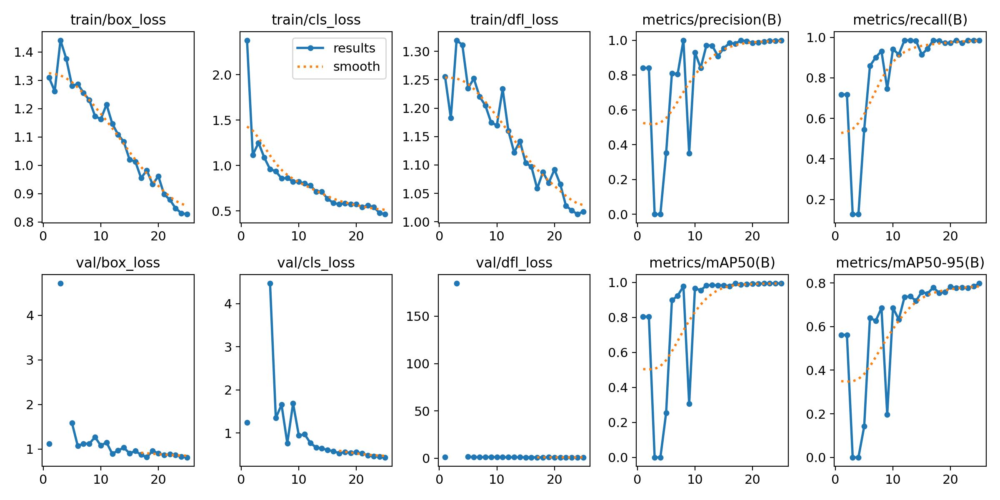

In [9]:
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

In [11]:
!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data=/content/drive/MyDrive/YOLO_dataset/data.yaml

Ultralytics YOLOv8.0.188 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients
val: Scanning /content/drive/MyDrive/YOLO_dataset/valid/labels.cache... 71 images, 0 backgrounds, 0 corrupt: 100% 71/71 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 5/5 [00:04<00:00,  1.15it/s]
                   all         71         71      0.998      0.986      0.994      0.799
Speed: 9.3ms preprocess, 33.4ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


In [12]:
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source=/content/drive/MyDrive/YOLO_dataset/test/images save=True

Ultralytics YOLOv8.0.188 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25840339 parameters, 0 gradients

image 1/69 /content/drive/MyDrive/YOLO_dataset/test/images/105_jpg.rf.26661ad50433cf0fee7125d8e61afb3d.jpg: 640x640 1 LP, 37.0ms
image 2/69 /content/drive/MyDrive/YOLO_dataset/test/images/108_jpg.rf.c271a7c3eadad5cb9866b9819d1cb757.jpg: 640x640 1 LP, 37.0ms
image 3/69 /content/drive/MyDrive/YOLO_dataset/test/images/125_jpg.rf.a1fb0514d604f6349b9d7982a8cc83ec.jpg: 640x640 1 LP, 37.0ms
image 4/69 /content/drive/MyDrive/YOLO_dataset/test/images/128_jpg.rf.09c55a4c1229de24ba4ed59946ab3db2.jpg: 640x640 1 LP, 37.0ms
image 5/69 /content/drive/MyDrive/YOLO_dataset/test/images/14_jpg.rf.54781da165aafa457264f25833d07b43.jpg: 640x640 1 LP, 37.0ms
image 6/69 /content/drive/MyDrive/YOLO_dataset/test/images/152_jpg.rf.2da72527fc51ddb69b3f73531c55b4e2.jpg: 640x640 1 LP, 37.0ms
image 7/69 /content/drive/MyDrive/YOLO_dataset/test/images/154_jpg.rf.

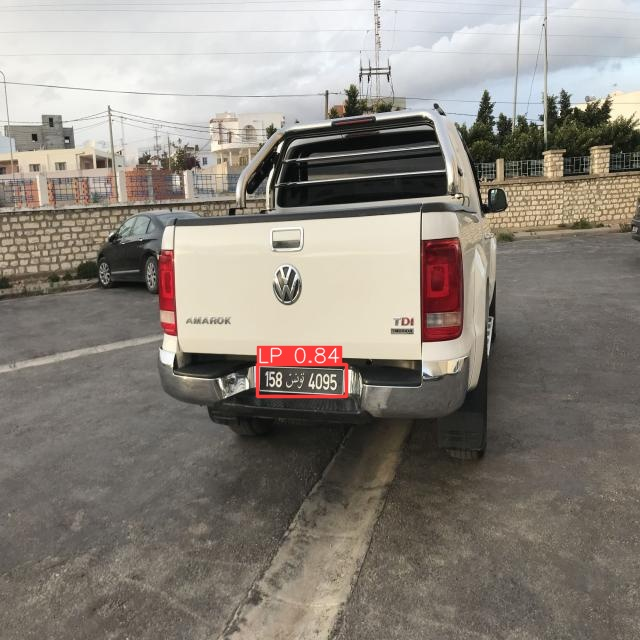

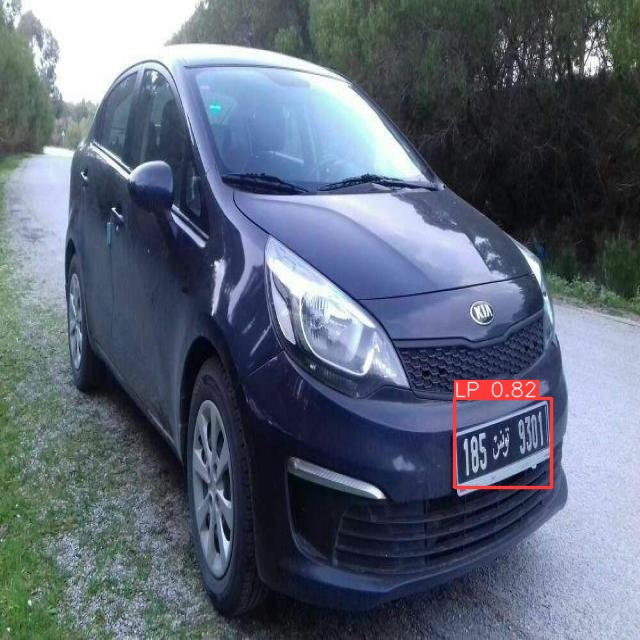

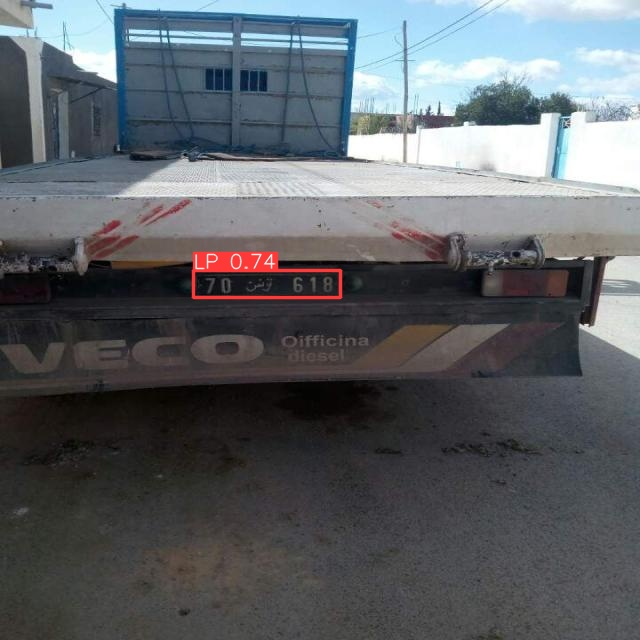

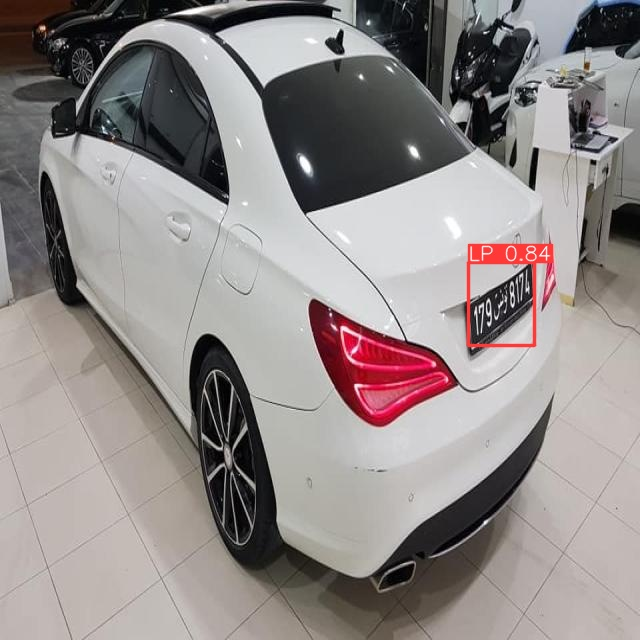

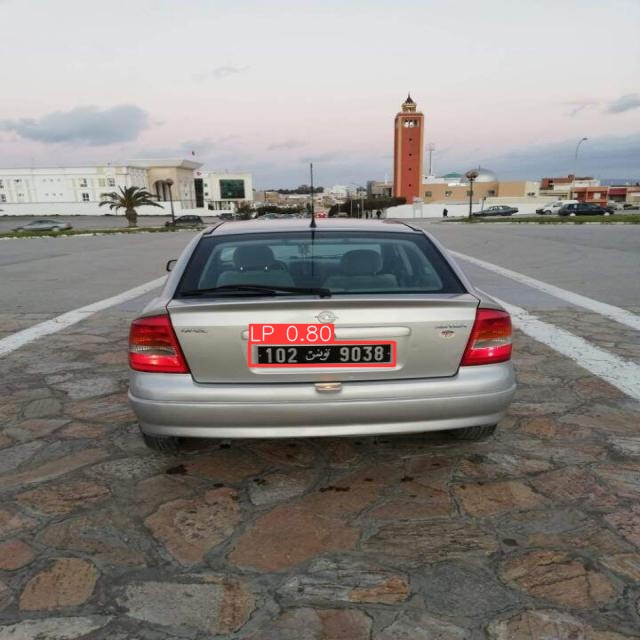

...

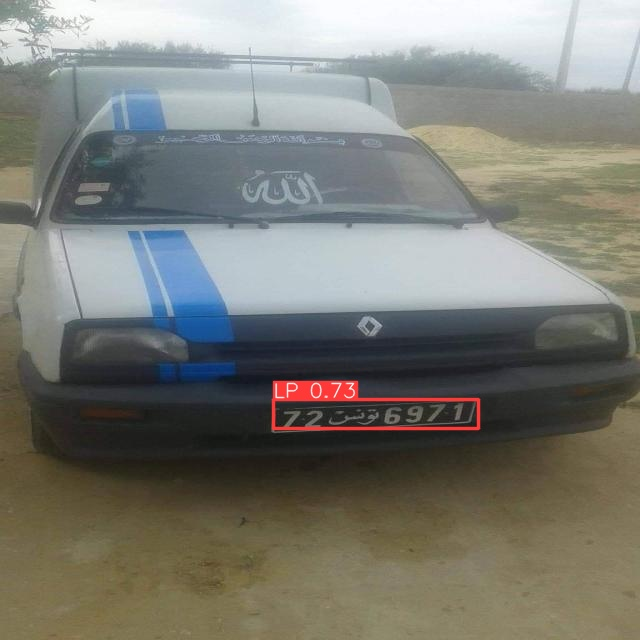

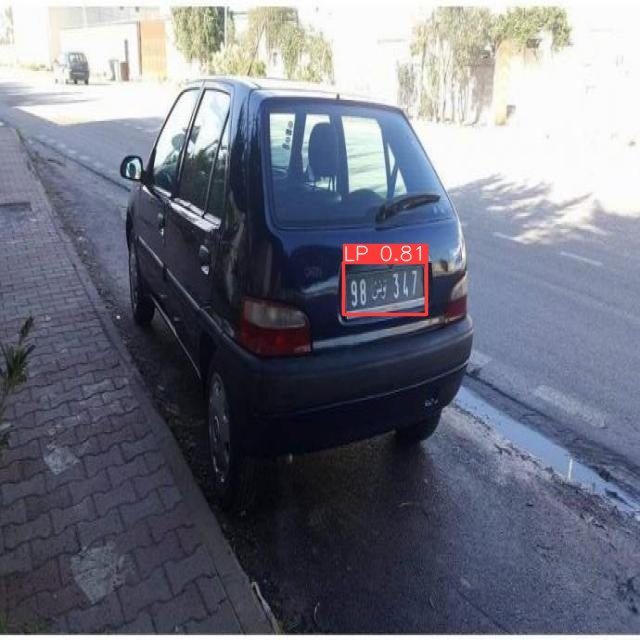

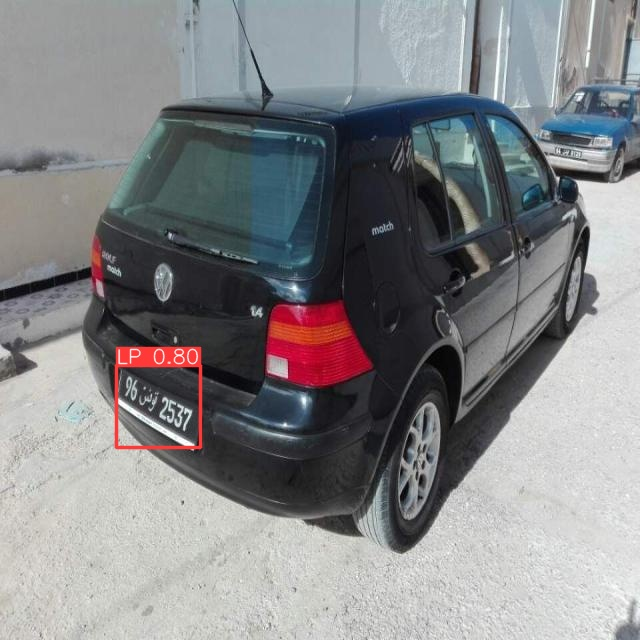

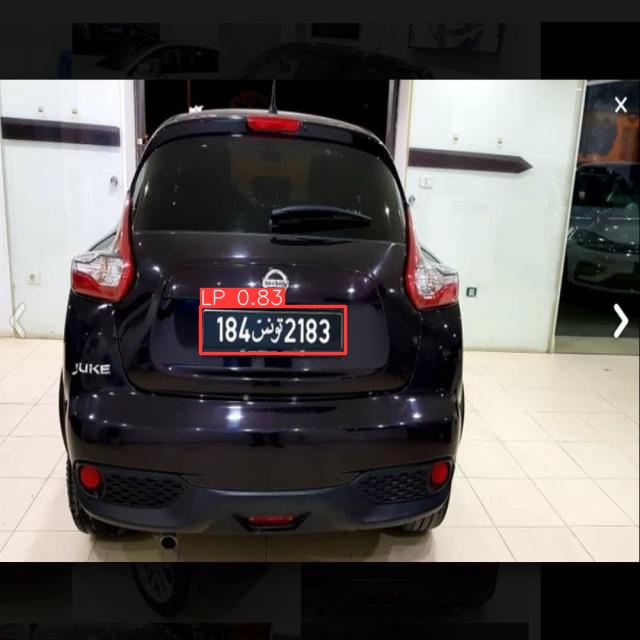

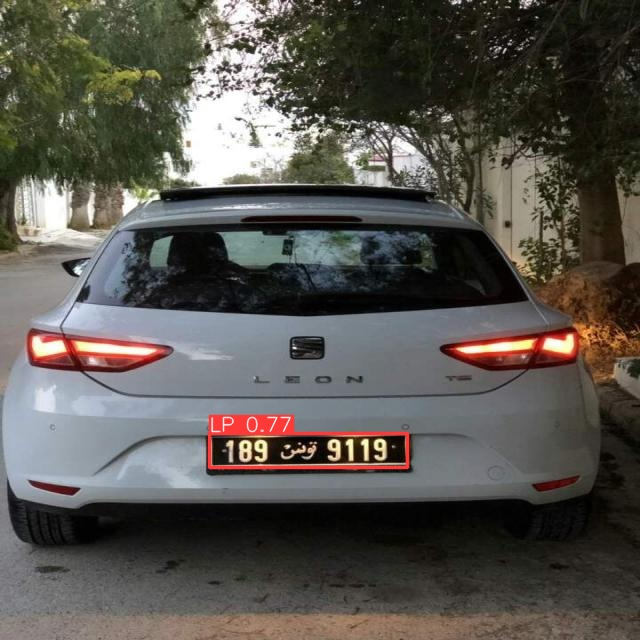

In [15]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg')[:]:
      display(Image(filename=image_path, width=600))
      print("\n")